**Project plan**

*Data preprocessing
1. DONE - Detect the english tweets
https://github.com/rfk/pyenchant

*Sentiment Analysis*
1. Find a sentiment analysis NN to rate last tweets
2. DONE - Extract the emoji's and incorporate the emoji sentiment <br>
https://stackoverflow.com/questions/43852668/using-collections-counter-to-count-emojis-with-different-colors<br>
https://stackoverflow.com/questions/48340622/extract-all-emojis-from-string-and-ignore-fitzpatrick-modifiers-skin-tones-etc

*Build a pipeline for similar tweet recommender*
1. DONE - Implement class for recommend engine
2. DONE - Build a pipeline for word embedding, vectorizing, and recommendation
3. Try out Glove, Google embedding.. etc

*Expansion
1. Narrow down recommendation to resolved tickets
2. Perform 3 types of clustering
3. Perform cluster summarization

In [ ]:
import string
import emoji
import regex
import pickle
import re
import enchant
import math
import inflect
import gensim

import numpy as np
import pandas as pd
import vaderSentiment

import matplotlib.pyplot as plt

from itertools import compress
from tqdm import tqdm_notebook
from termcolor import colored
from copy import deepcopy

# gensim
from gensim import corpora, models, similarities, matutils
# sklearn
from sklearn import datasets
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.feature_extraction import text
from sklearn.decomposition import NMF, TruncatedSVD
import nltk.sentiment.vader
from sklearn.neighbors import NearestNeighbors
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from nltk.stem import WordNetLemmatizer
    
from sklearn.cluster import KMeans
from nltk.tokenize import word_tokenize

from sklearn.cluster import DBSCAN, SpectralClustering, MeanShift
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.cluster import KMeans
from itertools import cycle
import seaborn as sns

from sklearn import metrics
from sklearn.metrics import pairwise_distances
from sklearn.metrics import silhouette_score

%matplotlib inline

In [ ]:
twitter = pd.read_csv("./customer-support-on-twitter/twcs.csv")

# Save original message for future recommendation display
ticket_reserve = twitter[twitter['inbound'] == True]
solution_reserve = twitter[twitter['inbound'] == False]

In [374]:
pd.set_option('display.max_colwidth', -1)

### Exclude tweets with non-English characters

In [ ]:
text = '^23'
re.sub(r'^\w+', 'jk', text)

In [ ]:
twitter.text[170:171].apply(lambda x:clean_text(x, cList))

In [ ]:
def fixContractions(text, cList):
    for word in text.split():
        if word.lower() in cList:
            text = text.replace(word, cList[word.lower()])
    return text

def clean_text(text, cList):
    text = text.lower()
    text = text.replace('\n', '')
    text = re.sub(r'https:\/\/t.co\/\w{10}', '', text) # Remove URL link
    text = re.sub(r'@\w+', '', text) # Remove @account
    text = re.sub(r'^\w+', '', text) # Remove @account
    text = fixContractions(text, cList) # Expand contractions
    return text

In [ ]:
def get_emoji_free_text(text):
    text = text.replace(u'\u200d', '')
    allchars = [str for str in text]
    emoji_list = [c for c in allchars if c in emoji.UNICODE_EMOJI]
    clean_text = ' '.join([str for str in text.split() if not any(i in str for i in emoji_list)])
    if (len(emoji_list) == 0):
        return np.NaN, clean_text
    else:
        return emoji_list, clean_text

In [ ]:
with open('./data/helper/contraction_list.pkl', 'rb') as picklefile:
    cList = pickle.load(picklefile)
twitter['text'] = twitter['text'].apply(lambda x:clean_text(x, cList))
twitter[['emoji','text']] = twitter['text'].apply(lambda x:pd.Series(get_emoji_free_text(x)))

In [ ]:
with open('./data/processed/tweets_step1_emoji_extracted.pkl', 'wb')as picklefile:
    pickle.dump(twitter, picklefile)

In [ ]:
with open('./data/processed/tweets_step1_emoji_extracted.pkl', 'rb')as picklefile:
    twitter = pickle.load(picklefile)

### Retrieve sentiment score for emoji's
ref:http://kt.ijs.si/data/Emoji_sentiment_ranking/

In [ ]:
def build_dict(emoji_table, emoji_sentiment_dict):
    type_set = set()
    for i in range(emoji_table.shape[0]):
        code = emoji_table.loc[i, 'Python Code']
        try:
            key = chr(int(code[1:], 16))
            emoji_sentiment_dict[key] = emoji_table.loc[i, 'Sentiment score']
        except:
            type_set.add(emoji_table.loc[i, 'Unicode block'])
    return emoji_sentiment_dict

In [ ]:
def get_emoji_sentiment(emoji_list):
    score = 0
    if (type(emoji_list) != float):
        for emoji_item in emoji_list:
            if (emoji_item in emoji_sentiment_dict.keys()):
                score += emoji_sentiment_dict[emoji_item]
        if (score == 0):
            return np.NaN
        else:
            return score/len(emoji_list)
    else:
        return np.NaN

In [ ]:
emoji_sentiment = pd.read_csv('./data/raw/emoji_nodingbat.csv')
emoji_other = pd.read_csv('./data/raw/emoji_other.csv')
emoji_sentiment_dict = {}

emoji_sentiment_dict = build_dict(emoji_sentiment, emoji_sentiment_dict)
emoji_sentiment_dict = build_dict(emoji_other, emoji_sentiment_dict)

twitter['emoji_score'] = twitter['emoji'].apply(lambda x:get_emoji_sentiment(x))
print ('Number of tweets with emoji score: ', twitter[~twitter['emoji_score'].isnull()].shape[0])
print ('Number of tweets with emoji but not score: ', twitter[twitter['emoji_score'].isnull() & (~twitter['emoji'].isnull())].shape[0])

In [ ]:
with open('./data/processed/tweets_step2_emoji_sentiment.pkl', 'wb')as picklefile:
    pickle.dump(twitter, picklefile)

In [ ]:
with open('./data/processed/tweets_step2_emoji_sentiment.pkl', 'rb')as picklefile:
    twitter = pickle.load(picklefile)

### Remove non-English tweets

In [ ]:
# Retrieve elements that are printable in English context - This is a 
# combination of digits, letters, punctuation, and whitespace.
valid_content = set(string.printable)

# Include some common non-English punctuations
non_English_punctuation = ['‘', '’', 'é', '–','—','“','”','、','。','`','️', '£', '…', '$']

# Keep tweets with common non-English punctuations
[valid_content.add(x) for x in (non_English_punctuation)]
    
def isEnglish(tweet):
    invalid_index = [x not in valid_content for x in tweet]
    if (np.sum(invalid_index)==0):
        return True
    else:
        return False

## Removed 78k tweets with non-English characters
english_tweets = twitter.text.apply(lambda x:isEnglish(x))
tweets = twitter.loc[english_tweets, :]

In [ ]:
# A quick tool to return non-English words
def non_English(words):
    print (list(compress(list(words), [x not in valid_content for x in words])))

### Format the dates

In [ ]:
# Format the dates
tweets['created_at'] = pd.to_datetime(tweets['created_at'], format='%a %b %d %H:%M:%S +0000 %Y')

In [ ]:
tweets['in_response_to_tweet_id'] = tweets['in_response_to_tweet_id'].fillna(-1)
tweets['in_response_to_tweet_id'] = tweets['in_response_to_tweet_id'].astype(int)
tweets['response_tweet_id'] = tweets['response_tweet_id'].fillna(-1)

In [ ]:
with open('./data/processed/tweets_step3_english.pkl', 'wb')as picklefile:
    pickle.dump(tweets, picklefile)

In [ ]:
with open('./data/processed/tweets_step3_english.pkl', 'rb')as picklefile:
    tweets = pickle.load(picklefile)

### Add custom_id and brand_id columns

In [ ]:
# Add custom_id column
tweets = pd.merge(tweets,pd.DataFrame(tweets[['tweet_id', 'author_id']]),left_on='in_response_to_tweet_id', right_on='tweet_id', how='left')
tweets.loc[tweets['inbound'] == True, 'author_id_y'] = tweets.loc[tweets['inbound'] == True, 'author_id_x']
tweets['author_id_y'] = tweets['author_id_y'].fillna(-1)
tweets.drop('tweet_id_y', axis=1, inplace=True)
tweets.rename(columns={'author_id_y':'cust_id', 
                       'author_id_x':'author_id',
                      'tweet_id_x':'tweet_id'}, inplace=True)

# Drop the tweets without customer id, those are usually promotional tweets initiated by
# brands agent or customers not in the datase: Number of such tweets: 71255
tweets = tweets[~tweets['cust_id'].isnull()]

In [ ]:
# Add brand_id column

# Carve out the first tweet id when there are multiples in response_tweet_id
tweets['processed_response_id'] = tweets['response_tweet_id'].apply(
    lambda x: x if (isinstance(x,int)) else x.split(',')[0])
tweets['processed_response_id'] = tweets['processed_response_id'].astype(int)

# Retrieve the author id of the responde tweet
tweets = pd.merge(tweets,pd.DataFrame(tweets[['tweet_id', 'author_id']]),
                  left_on='processed_response_id', 
                  right_on='tweet_id', 
                  how='left')

tweets.drop('tweet_id_y', axis=1, inplace=True)
tweets.rename(columns={'author_id_y':'brand_id', 
                       'author_id_x':'author_id',
                      'tweet_id_x':'tweet_id'}, inplace=True)

tweets = pd.merge(tweets,pd.DataFrame(tweets[['tweet_id', 'author_id']]),left_on='in_response_to_tweet_id', right_on='tweet_id', how='left')
tweets.loc[(tweets['inbound'] & (tweets['processed_response_id'] == -1)), 'brand_id'] = (
    tweets.loc[(tweets['inbound'] & (tweets['processed_response_id'] == -1)), 'author_id_y'])
tweets.rename(columns={'tweet_id_x':'tweet_id', 
                       'author_id_x':'author_id'}, inplace=True)

tweets.loc[tweets['inbound'] == False, 'brand_id'] = tweets.loc[tweets['inbound'] == False, 'author_id']
tweets.drop(['processed_response_id', 'tweet_id_y', 'author_id_y'], axis=1, inplace=True)

# could use some more logic to extract the account name in tweet text

In [ ]:
# Tweets with no response is 3880
print (tweets[tweets['brand_id'].isnull() & (tweets['response_tweet_id'] == -1)].shape)

# Tweets with response outside the dataset is 42764
print (tweets[tweets['brand_id'].isnull() & (tweets['response_tweet_id'] != -1)].shape)

# Drop the tweets without brand_id
tweets = tweets[~tweets['brand_id'].isnull()]

In [ ]:
# Identify which tweets are in the same conversation (customer case)
tweets.sort_values(['cust_id', 'created_at'], inplace=True)
tweets.reset_index(inplace=True)

# Calculate the time difference (in seconds) bwetween a tweet and its previous tweet
tweets['time_diff'] = tweets['created_at'].diff()
tweets['time_diff'] = tweets['time_diff'].apply(lambda x:x.total_seconds())
tweets['time_diff'] = tweets['time_diff'].apply(lambda x: 0 if x <0 else x)
tweets['time_diff'] = tweets['time_diff'].fillna(0)

tweets['case_id'] = 0
tweets['time_diff'] = tweets['time_diff'].fillna(0) 

In [ ]:
with open('./data/processed/tweets_step4_brand_cust.pkl', 'wb')as picklefile:
    pickle.dump(tweets, picklefile)

In [ ]:
with open('./data/processed/tweets_step4_brand_cust.pkl', 'rb')as picklefile:
    tweets = pickle.load(picklefile)

### Carve out the support data for a particular brand

In [ ]:
def analyze_brand(tweets, brand_cc_name):
    ## Subset tweets according to brand
    brand = tweets[tweets['brand_id'] == brand_cc_name]
    brand.reset_index(inplace=True)
    
    ## Assign unique caseid for each conversation (interchange of tweets)
    ## To avoid grouping different cases raised by the same customer at different time
    ## We set the max threshold between subsequent tweets in a conversation as 2 days
    caseid = 1
    brand.loc[0, 'case_id'] = caseid
    for row in range(1, brand.shape[0]):
        if (row%1000 == 0):
            print (row)
        if ((brand.loc[row, 'cust_id'] != brand.loc[row-1, 'cust_id']) |
            (brand.loc[row, 'time_diff'] > 3600*24*2)):
            caseid = caseid + 1
            brand.loc[row, 'time_diff'] = 0 # Set time between conversations as 0
            brand.loc[row, 'case_id'] = caseid
        else:
            brand.loc[row, 'case_id'] = caseid
    return brand

In [ ]:
# CAUTION! This function takes SUPER LONG TIME to run, 80k row takes 3 hours!
spotify = analyze_brand(tweets, 'SpotifyCares')

In [ ]:
with open('./data/processed/spotify.pkl', 'wb')as picklefile:
    pickle.dump(spotify, picklefile)

In [ ]:
with open('./data/processed/spotify.pkl', 'rb')as picklefile:
    spotify = pickle.load(picklefile)

### Remove ticket without solution and solution without ticket

In [ ]:
conv_count = spotify.groupby('case_id')['case_id'].count()
single_conv_index = conv_count[conv_count==1].index.tolist()
spotify['single_conv'] = spotify['case_id'].apply(
    lambda x: True if x in single_conv_index else False)

# Remove the conversations with only one tweet (424 ) 
spotify = spotify[~spotify['single_conv']]
spotify.drop('single_conv', axis=1, inplace=True)

spotify.drop(['level_0', 'index'], axis=1, inplace=True)

In [ ]:
ticket = spotify[spotify['inbound'] == True]
solution = spotify[spotify['inbound'] == False]

In [ ]:
print (len(ticket.case_id.unique()))
len(solution.case_id.unique())

In [ ]:
# Remove ticket without solution or solution without ticket 
# conversations with tweets from only customer or customer agents

ticket = ticket.apply(
    lambda x: x if (x[12] in solution['case_id'].unique()) else None, axis = 1)
solution = solution.apply(
    lambda x: x if (x[12] in ticket['case_id'].unique()) else None, axis = 1)

In [ ]:
ticket[['tweet_id', 'text', 'case_id']]

In [ ]:
#ticket.text.fillna('', inplace=True)
#solution.text.fillna('', inplace=True)
ticket_agg = ticket.groupby('case_id')['text'].agg(lambda x:' '.join(x))
solution_agg = solution.groupby('case_id')['text'].agg(lambda x:' '.join(x))

In [ ]:
spotify = spotify.apply(
    lambda x: x if (x[10] in ticket['case_id'].unique()) else None, axis=1)

In [ ]:
with open('./data/processed/ticket.pkl', 'wb')as picklefile:
    pickle.dump(ticket, picklefile)
with open('./data/processed/solution.pkl', 'wb')as picklefile:
    pickle.dump(solution, picklefile)
with open('./data/processed/ticket_agg.pkl', 'wb')as picklefile:
    pickle.dump(ticket_agg, picklefile)
with open('./data/processed/solution_agg.pkl', 'wb')as picklefile:
    pickle.dump(solution_agg, picklefile)

### Perform very basic sentiment analysis on last tweet from customer

In [ ]:
cust_last_tweet = ticket.groupby('case_id')[['text','emoji', 'emoji_score']].last().reset_index()

In [ ]:
vdanalyzer = vaderSentiment.vaderSentiment.SentimentIntensityAnalyzer()
cust_last_tweet['vader_sentiment'] = cust_last_tweet['text'].apply(
        lambda x:vdanalyzer.polarity_scores(x)['compound'])

In [ ]:
sentiment_analyzer = nltk.sentiment.vader.SentimentIntensityAnalyzer()
cust_last_tweet['ntlk_sentiment'] = cust_last_tweet['text'].apply(
        lambda x:sentiment_analyzer.polarity_scores(x)['compound'])

In [ ]:
cust_last_tweet.to_csv('./data/processed/processed_last_tweet_sentiment.csv', index=False)

In [ ]:
cust_last_tweet = pd.read_csv('./data/processed/processed_last_tweet_sentiment.csv', index_col=None)

In [ ]:
def get_overall_sentiment_score(row):
    sentiment = ''
    if (not math.isnan(row[3])):
        if (row[3] >= 0.2):
            sentiment = 'POS'
        elif ((row[3] < 0.2) & (row[3] > -0.05)):
            sentiment = 'NEU'
        elif (row[3] <= -0.05):
            sentiment = 'NEG'
    elif (not math.isnan(row[5])):
        if (row[5] >= 0.2):
            sentiment = 'POS'
        elif ((row[5] < 0.2) & (row[5] > -0.05)):
            sentiment = 'NEU'
        elif (row[5] <= -0.05):
            sentiment = 'NEG'
    return sentiment

In [ ]:
cust_last_tweet[['emoji_score', 'ntlk_sentiment']] = cust_last_tweet[['emoji_score', 'ntlk_sentiment']].astype(float)
cust_last_tweet['sentiment'] = cust_last_tweet.apply(lambda
                        x:get_overall_sentiment_score(x), axis=1)

In [ ]:
cust_last_tweet.to_csv('./data/processed/processed_last_tweet_sentiment.csv', index=False)

In [ ]:
cust_last_tweet = pd.read_csv('./data/processed/processed_last_tweet_sentiment.csv', index_col=None)

In [ ]:
spotify = pd.merge(spotify, cust_last_tweet[['case_id', 'sentiment']],
                   left_on='case_id', right_on='case_id',
                   how='left')

In [ ]:
with open('./data/processed/tweets_step5_spotify_sentiment.pkl', 'wb')as picklefile:
    pickle.dump(spotify, picklefile)

In [ ]:
with open('./data/processed/tweets_step5_spotify_sentiment.pkl', 'rb')as picklefile:
    spotify = pickle.load(picklefile)

### Tweets preprocessing

In [ ]:
custom_stopwords = ['http', 'https', 'spotify', 'help', 'hi', 'spotifycares']
my_stop_words = (text.ENGLISH_STOP_WORDS.union(custom_stopwords)
                 .union(string.punctuation))

In [ ]:
df_ticket = pd.DataFrame(ticket_agg)
df_ticket.reset_index(inplace=True)

In [ ]:
df_solution = pd.DataFrame(solution_agg)
df_solution.reset_index(inplace=True)

In [ ]:
cust_last_tweet = pd.read_csv('./data/processed/processed_last_tweet_sentiment.csv', index_col=None)

In [ ]:
df_ticket = pd.merge(df_ticket, cust_last_tweet[['case_id', 'sentiment']], left_on='case_id', right_on='case_id',
                   how='left')

In [ ]:
def text_preprocess(text):
    tokens = word_tokenize(text)
    lemmatize = WordNetLemmatizer()
    clean_text = [lemmatize.lemmatize(token.lower().strip(), pos='a') for token in tokens]
    clean_text = [x for x in clean_text if x not in my_stop_words]
    return ' '.join(clean_text)

In [ ]:
df_ticket['text'] = df_ticket.text.apply(lambda x:text_preprocess(x))

In [ ]:
with open('./data/processed/tweets_step6_ticket_preprocessed.pkl', 'wb')as picklefile:
    pickle.dump(df_ticket, picklefile)

### Build recommendation engines

In [ ]:
## Read in files from previous steps
with open('./data/processed/tweets_step6_ticket_preprocessed.pkl', 'rb')as picklefile:
    df_ticket = pickle.load(picklefile)

cust_last_tweet = pd.read_csv('./data/processed/processed_last_tweet_sentiment.csv', index_col=None)

with open('./data/processed/ticket.pkl', 'rb')as picklefile:
    ticket = pickle.load(picklefile)

with open('./data/processed/solution.pkl', 'rb')as picklefile:
    solution = pickle.load(picklefile)
    
with open('./data/processed/ticket_agg.pkl', 'rb')as picklefile:
    ticket_agg = pickle.load(picklefile)

with open('./data/processed/solution_agg.pkl', 'rb')as picklefile:
    solution_agg = pickle.load(picklefile)
'''
with open('./data/processed/engines.pkl', 'rb') as picklefile:
    engines = pickle.load(picklefile)

engine_1 = engines[1]
engine_2 = engines[2]
engine_3 = engines[3]
'''    

In [ ]:
custom_stopwords = ['http', 'https', 'spotify', 'help', 'hi', 'spotifycares']
my_stop_words = (text.ENGLISH_STOP_WORDS.union(custom_stopwords)
                 .union(string.punctuation))

In [ ]:
with open('./data/processed/engines.pkl', 'rb') as picklefile:
    engines = pickle.load(picklefile)

engine_1 = engines[1]
engine_2 = engines[2]
engine_3 = engines[3]

In [ ]:
class RecommendationEngine:
    def __init__(self, vectorizer, n_components, reducer, ticket, solution):
        self.vectorizer = vectorizer
        self.n_dim = n_components
        self.reducer = reducer(n_components)
        self.ticket = ticket
        self.solution = solution
        
    def fit(self, df):
        self.vector_data = self.vectorizer.fit_transform(df['text'])
        self.topic_data = self.reducer.fit_transform(self.vector_data)
        self.df = df_ticket
        return self.topic_data
    
    def _print_recommendations(self, article, rec_list):
        p = inflect.engine()
        print('NEW MESSAGE:', article)
        i = 1
        for resp in self.df.loc[rec_list]['case_id']:
            print(f'\n---{p.ordinal(i)} SIMILAR CONVERSATION---\n')
            self._display_conversation(resp)
            print('\n')
            i += 1
    
    def _display_conversation (self, case_id):
        cust_conv = self.ticket[self.ticket['case_id'] == case_id][['created_at', 'inbound', 'text']]
        agent_conv = self.solution[self.solution['case_id'] == case_id][['created_at', 'inbound', 'text']]
        conv_list = pd.concat([cust_conv, agent_conv]).sort_values('created_at')
        for i in range(conv_list.shape[0]):
            if (conv_list.iloc[i]['inbound']):
                print ('CUSTOMER:   ', colored(conv_list.iloc[i]['text'], 'red'))
            else:
                print ('AGENT:      ', colored(conv_list.iloc[i]['text'], 'green'))
        
    def recommend(self, article, num_to_return):
        article_vectorized = self.vectorizer.transform([article])
        article_topic_vector = self.reducer.transform(article_vectorized)
        nn = NearestNeighbors(n_neighbors=num_to_return, metric='cosine', algorithm='brute')
        
        tmp = self.vectorizer.transform(self.df[self.df['sentiment']=='POS'].text)
        tmp2 = self.reducer.transform(tmp)
        
        nn.fit(tmp2)
        results = nn.kneighbors(article_topic_vector)
        #result_texts = [self.texts[i] for i in results[1][0]]
        rec_list = results[1][0]
        print ('number of results: ', len(rec_list))
        self._print_recommendations(article, rec_list)
        
        return rec_list
    
    def display_topics(self, no_top_words, topic_names=None):
        feature_names = self.vectorizer.get_feature_names()
        for ix, topic in enumerate(self.reducer.components_):
            if not topic_names or not topic_names[ix]:
                print("\nTopic ", ix)
            else:
                print("\nTopic: '",topic_names[ix],"'")
            print(", ".join([feature_names[i]
                for i in topic.argsort()[:-no_top_words - 1:-1]]))

In [ ]:
ticket_origin = pd.merge(ticket_reserve[['tweet_id', 'created_at', 'inbound', 'text']], ticket[['tweet_id', 'case_id']], left_on='tweet_id', right_on='tweet_id', how='right')
solution_origin = pd.merge(solution_reserve[['tweet_id', 'created_at', 'inbound', 'text']], solution[['tweet_id', 'case_id']], left_on='tweet_id', right_on='tweet_id', how='right')

In [ ]:
tfidf_vectorizer = TfidfVectorizer(ngram_range=(1, 2),  
                                   stop_words=my_stop_words, 
                                   token_pattern="\\b[a-z][a-z]+\\b",
                                   lowercase=True,
                                   max_df = 0.4)

count_vectorizer = CountVectorizer(ngram_range=(1, 2),  
                                   stop_words='english', 
                                   token_pattern="\\b[a-z][a-z]+\\b",
                                   lowercase=True,
                                   max_df = 0.4)


#tfidf_data = tfidf_vectorizer.fit_transform(list(df_ticket.text))

In [ ]:
tfidf_data = tfidf_vectorizer.fit_transform(list(df_ticket.text))
lsa_tfidf = TruncatedSVD(n_components=50)
lsa_tfidf_data = lsa_tfidf.fit_transform(tfidf_data)
cv_data = count_vectorizer.fit_transform(list(df_ticket.text))
cv_nmf = NMF(n_components=10)
cv_nmf_data = cv_nmf.fit_transform(cv_data)

In [ ]:
engine_1 = RecommendationEngine(tfidf_vectorizer, n_components = 300, reducer = TruncatedSVD, ticket = ticket_origin, solution=solution_origin)
topic_data = engine_1.fit(df_ticket)

In [ ]:
engine_2 = RecommendationEngine(count_vectorizer, n_components = 300, reducer = NMF, ticket = ticket_origin, solution=solution_origin)
engine_2.fit(df_ticket)

In [ ]:
engine_3 = RecommendationEngine(tfidf_vectorizer, n_components = 300, reducer = NMF, ticket = ticket_origin, solution=solution_origin)
engine_3.fit(df_ticket)

In [ ]:
engine_dict = {1:engine_1, 2:engine_2, 3:engine_3}

In [ ]:
with open('./data/processed/engines.pkl', 'wb') as picklefile:
    pickle.dump(engine_dict, picklefile)

In [ ]:
cust_first_tweet = ticket.groupby('case_id')[['text']].first().reset_index()
sample = cust_first_tweet.text[np.random.choice(cust_first_tweet.shape[0])]

In [441]:
index = 51

In [442]:
engine_1.recommend(cust_first_tweet.text[index], 3)

number of results:  3
NEW MESSAGE: any particular reason i got unsubscribed today?

---1st SIMILAR CONVERSATION---

CUSTOMER:    what's wrong with spotify??????
AGENT:       @368379 Hey, that doesn't sound good! Can you let us know your device's make/model, operating system, and Spotify version? /GT
CUSTOMER:    @SpotifyCares well i've updated the app and it looks like it's getting better. if the problem is back, i'll ask for your help. thank you
AGENT:       @368379 Awesome! Give us a shout if it starts misbehaving again; we're always... https://t.co/LgAM6ky9Vv 🙂 /GT



---2nd SIMILAR CONVERSATION---

CUSTOMER:    @115888 Could we get a 'Discover History' playlist that has all our old Discover playlists in? Its sad when I miss a week :(
AGENT:       @187965 Nice idea! It's definitely something for the team to consider and we'll make sure it reaches them /MX
CUSTOMER:    @SpotifyCares Thank you!
AGENT:       @187965 Awesome! Let us know if you ever need us again. We'd be... https://t.c

array([ 9584,  2580, 10724])

In [443]:
engine_2.recommend(cust_first_tweet.text[index], 3)

number of results:  3
NEW MESSAGE: any particular reason i got unsubscribed today?

---1st SIMILAR CONVERSATION---

CUSTOMER:    @115888 DM me or i’ll cry
AGENT:       @155928 Hey Olivia. Don't cry, help's here! Could you send over your email address via DM? Also, if you're receiving any error messages, a screenshot of it would be very helpful. We'll see what's going on /KA https://t.co/ldFdZRiNAt



---2nd SIMILAR CONVERSATION---

CUSTOMER:    @116130 it would be nice to be notified that i need to confirm im a student still rather than automatically being charged a tenner..
AGENT:       @404333 Hey George! Can you DM us your username or email address? We'll check backstage /HC https://t.co/ldFdZRiNAt



---3rd SIMILAR CONVERSATION---

CUSTOMER:    @115888 Could we get a 'Discover History' playlist that has all our old Discover playlists in? Its sad when I miss a week :(
AGENT:       @187965 Nice idea! It's definitely something for the team to consider and we'll make sure it reaches th

array([ 1612, 10904,  2580])

In [444]:
engine_3.recommend(cust_first_tweet.text[index], 3)

number of results:  3
NEW MESSAGE: any particular reason i got unsubscribed today?

---1st SIMILAR CONVERSATION---

CUSTOMER:    Mas saya udah bayar langganan kok blom premium? @117153
AGENT:       @399880 Hey Daffa! We can help out in English via Facebook, but we also have Indonesian support through email at https://t.co/ZgU70TbP8M. Let us know how you'd like to proceed /LP



---2nd SIMILAR CONVERSATION---

CUSTOMER:    @115888 Can you please create This is: Pavement playlist? Thanks! 🙂
AGENT:       @153619 Hi there! Thanks for the feedback. We'll be sure to let the right team know it's something you'd like to see 🙂 /JI
CUSTOMER:    @SpotifyCares Yay, thank you! And, just so you know, I love This is: playlist series 😄
AGENT:       @153619 Aww, we're glad to hear that 💚 If you have other questions or feedback about the app, just give us a shout! /RR
CUSTOMER:    @SpotifyCares OK, I will! 🙂
AGENT:       @153619 Cool! https://t.co/M9DGmitf5G 🤘 /RR



---3rd SIMILAR CONVERSATION---

CUST

array([10724,  1503,  4317])

In [445]:
recommend_word2vec(df_ticket, google_model, 3, cust_first_tweet.text[index])

/Users/songlin/anaconda2/envs/Python36/lib/python3.6/site-packages/ipykernel_launcher.py:7: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).
  import sys
/Users/songlin/anaconda2/envs/Python36/lib/python3.6/site-packages/ipykernel_launcher.py:15: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).
  from ipykernel import kernelapp as app


NEW MESSAGE: any particular reason i got unsubscribed today?

---1st SIMILAR CONVERSATION---

CUSTOMER:    do you know if spotify is compatible with the nokia 216 phone?
AGENT:       hey there! we are afraid we only support smartphones running ios and android os. let us know if there is anything else /ap



---2nd SIMILAR CONVERSATION---

CUSTOMER:    hi there little typo here, this should be axle
AGENT:       hey, thanks! we will be sure to get this reported. great detective work... /dh
CUSTOMER:    haha thanks !
AGENT:       /dh



---3rd SIMILAR CONVERSATION---

CUSTOMER:    hey i cant make searches in the app with "%" symbol- tried to look up 200% (found it) but just fyi idk if this was on your radar
AGENT:       hi there! thanks for the heads up. we will make sure to pass your feedback on to the right team /au
CUSTOMER:    tyty nice to know you all #cares
AGENT:       you are welcome! let us know if you ever need us again. we had be... /au




### Try word2vec model

In [ ]:
# Function to take a document as a list of words and return the document vector
def get_doc_vec(words, model):
    good_words = []
    for word in words:
        # Words not in the original model will fail
        try:
            if model.wv[word] is not None:
                good_words.append(word)
        except:
            continue
    # If no words are in the original model
    if len(good_words) == 0:
        return [0.0]*300
    # Return the mean of the vectors for all the good words
    return model.wv[good_words].mean(axis=0)

In [ ]:
google_vec_file = '~/Downloads/GoogleNews-vectors-negative300.bin'
google_model = gensim.models.KeyedVectors.load_word2vec_format(google_vec_file, binary=True)

In [ ]:
def print_recommendations(df, article, rec_list):
    p = inflect.engine()
    print('NEW MESSAGE:', article)
    i = 1
    for resp in df.loc[rec_list]['case_id']:
        print(f'\n---{p.ordinal(i)} SIMILAR CONVERSATION---\n')
        display_conversation(resp)
        print('\n')
        i += 1

def display_conversation (case_id):
    cust_conv = ticket[ticket['case_id'] == case_id][['created_at', 'inbound', 'text']]
    agent_conv = solution[solution['case_id'] == case_id][['created_at', 'inbound', 'text']]
    conv_list = pd.concat([cust_conv, agent_conv]).sort_values('created_at')
    for i in range(conv_list.shape[0]):
        if (conv_list.iloc[i]['inbound']):
            print ('CUSTOMER:   ', colored(conv_list.iloc[i]['text'], 'red'))
        else:
            print ('AGENT:      ', colored(conv_list.iloc[i]['text'], 'green'))

In [ ]:
def recommend_word2vec(df, model, num_to_return, article):
    tmp = df[df['sentiment']=='POS'].text
    ticket_google_vecs = tmp.map(lambda x: get_doc_vec(x.split(), model))
    df_ticket_google = pd.DataFrame(ticket_google_vecs.values.tolist())
    nn = NearestNeighbors(n_neighbors=num_to_return, metric='cosine', algorithm='brute')
    nn.fit(df_ticket_google)
    new_vecs = get_doc_vec(article.split(), model)
    tmp2 = pd.DataFrame([new_vecs.tolist()])
    rec_list = nn.kneighbors(tmp2)[1][0].tolist()
    
    print_recommendations(df, article, rec_list)
    return 

In [ ]:
recommend_word2vec(df_ticket, google_model, 3, cust_first_tweet.text[index])

In [ ]:
ticket_google_vecs = df_ticket.text.map(lambda x: get_doc_vec(x.split(), google_model))
df_ticket_google = pd.DataFrame(ticket_google_vecs.values.tolist())

In [ ]:
df_ticket_google.shape

### Perform Clustering

### DBSCAN

In [ ]:
X = StandardScaler().fit_transform(lsa_tfidf_data)
db = DBSCAN(eps=0.15, min_samples=3).fit(X)

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

unique_labels = set(labels)
colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_labels)))
plt.figure(dpi=200)
show_core = True
show_non_core = True
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = 'k'

    class_member_mask = (labels == k)
    if show_core:
        xy = X[class_member_mask & core_samples_mask]
        x, y = xy[:,0], xy[:,1]
        plt.scatter(x, y, c=col, edgecolors='k',  s=20, linewidths=1.1)
    
    if show_non_core:
        xy = X[class_member_mask & ~core_samples_mask]
        x, y = xy[:,0], xy[:,1]
        plt.scatter(x, y, c=col, s=20, linewidths=1.1)

plt.title('Estimated number of clusters: %d' % n_clusters_);

In [ ]:
plt.figure(dpi=250)
plt.title("TSNE FOR DBSCAN - LSA TFIDF DATA")
sns.scatterplot(google_embedded[:, 0], google_embedded[:, 1], labels,
               size = 2, palette = 'rainbow', alpha = 'auto',
              markers = '.', legend="full");

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.);

### Mean Shift

In [ ]:
# The following bandwidth can be automatically detected using
bandwidth = estimate_bandwidth(lsa_tfidf_data, quantile=0.2, n_samples=500)

ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms.fit(X)
labels = ms.labels_
cluster_centers = ms.cluster_centers_

labels_unique = np.unique(labels)
n_clusters_ = len(labels_unique)

print("number of estimated clusters : %d" % n_clusters_)

In [ ]:
plt.figure(1)
plt.clf()
plt.figure(dpi=200)
colors = cycle('byrcmykbgrcmykbgrcmykbgrcmyk')
for k, col in zip(range(n_clusters_), colors):
    my_members = labels == k
    cluster_center = cluster_centers[k]
    plt.plot(X[my_members, 0], X[my_members, 1], col + '.')
    plt.plot(cluster_center[0], cluster_center[1], 'X', markerfacecolor='k',
             markeredgecolor='k', markersize=14)
plt.title('Estimated number of clusters: %d' % n_clusters_);

### KMeans

In [ ]:
def get_cluster_centers(X, labels, k_num):
    CC_list = []
    for k in range(k_num):
        # get the mean coordinates of each cluster
        CC_list.append(np.mean(X[labels == k], axis = 0))
    return CC_list

# for each cluster substract the mean from each data point to get the error
# then get the magnitude of each error, square it, and sum it
def get_SSE(X, labels):
    k_num = len(np.unique(labels))
    CC_list = get_cluster_centers(X, labels, k_num)
    CSEs = []
    for k in range(k_num):
        # for each cluster of k we get the coordinates of how far off each point is to the cluster
        error_cords = X[labels == k] - CC_list[k]
        # square the coordinates and sum to get the magnitude squared
        error_cords_sq = error_cords ** 2
        error_mag_sq = np.sum(error_cords_sq, axis = 1)
        # since we already have the magnitude of the error squared we can just take the sum for the cluster
        CSE = np.sum(error_mag_sq)
        CSEs.append(CSE)
    # sum each cluster's sum of squared errors
    return sum(CSEs)

In [ ]:
def find_elbow(data, low, high, step, title):
    SSEs = []
    X = StandardScaler().fit_transform(lsa_tfidf_data)
    for k in range(low, high, step):
        #print ('clustering trial:', k)
        km = KMeans(n_clusters=k, random_state=1)
        km.fit(X)
        labels = km.labels_
        #Sil_coefs.append(metrics.silhouette_score(lsa_tfidf_data, labels, metric='euclidean'))
        SSEs.append(get_SSE(X, labels)) # The SSE is just inertia, we could have just said km.inertia_

    k_clusters = range(low, high, step)
    plt.figure(dpi=200)

    # plot Intertia/SSE on ax2
    plt.plot(k_clusters, SSEs)
    plt.xlabel('number of clusters')
    plt.ylabel('SSE')
    plt.xticks(np.arange(low, high, step=step));
    plt.title ('SSE vs Clusters - ', title)
    return None

In [ ]:
find_elbow(cv_nmf_data, 2, 100, 4)

In [ ]:
def fitKmeans(data, n_clusters):
    X = StandardScaler().fit_transform(data)
    km = KMeans(n_clusters=n_clusters)
    y_pred = km.fit_predict(X)
    plt.figure(dpi=200)
    plt.scatter(X[:,0],X[:,1],c=plt.cm.rainbow(ypred*20),s=14);
    return y_pred, km

In [ ]:
y_pred_cv_nmf, km_cv = fitKmeans(cv_nmf_data, 15)

In [ ]:
cv_nmf_embedded = TSNE(n_components=2, verbose=1, perplexity=50).fit_transform(cv_nmf_data)
cv_nmf_data.shape

In [ ]:
def plot_on_tsne(pred, title, tsne_embedded):
    plt.figure(dpi=250)
    plt.title(title)
    sns.scatterplot(tsne_embedded[:, 0], tsne_embedded[:, 1], pred,
                   size = 2, palette = 'rainbow', alpha = 'auto',
                  markers = '.', legend="full");

    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.);
    return None

In [ ]:
cv_nmf_embedded.shape

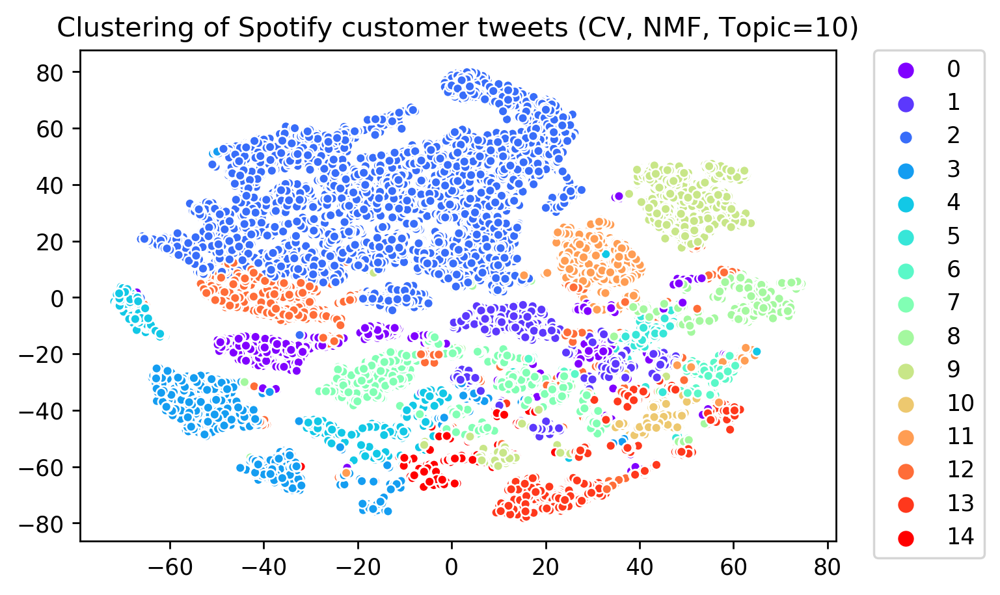

In [446]:
plot_on_tsne(y_pred_cv_nmf, 'Clustering of Spotify customer tweets (CV, NMF, Topic=10)', cv_nmf_embedded)

In [376]:
def checkfeature_on_tsne(tsne_embedded, title, data, i):
    plt.figure(dpi=250)
    plt.title(f'{title} on topic {i}')
    sns.scatterplot(tsne_embedded[:, 0], tsne_embedded[:, 1], data[:,i],
                   size = 1, palette = 'cubehelix', alpha=0.4,
                  markers = '.', legend="brief");

    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.);

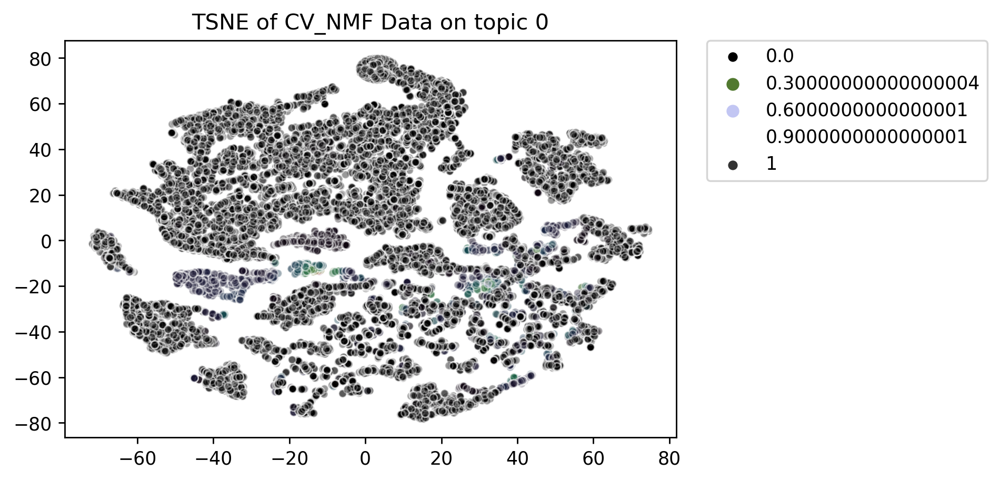

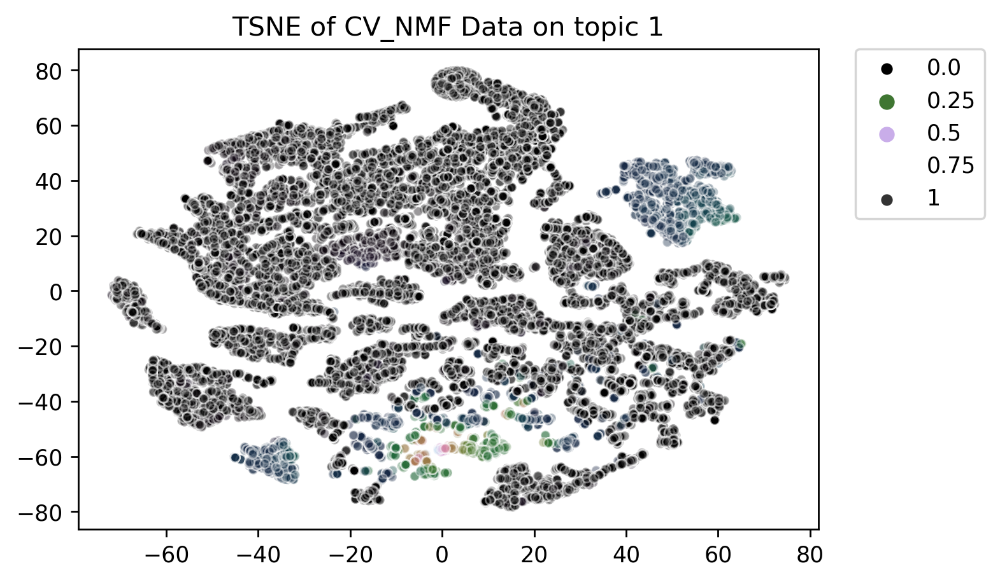

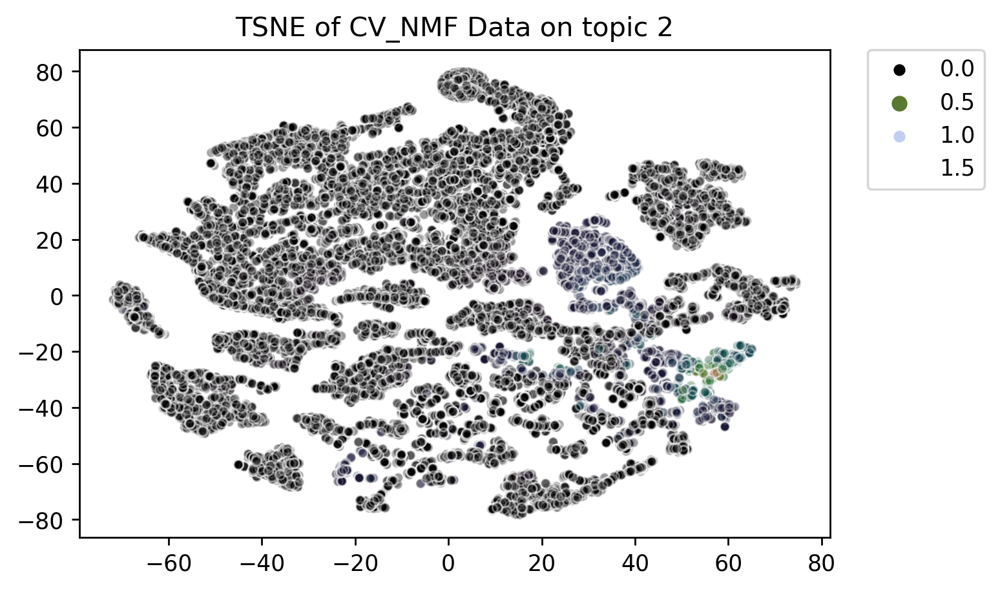

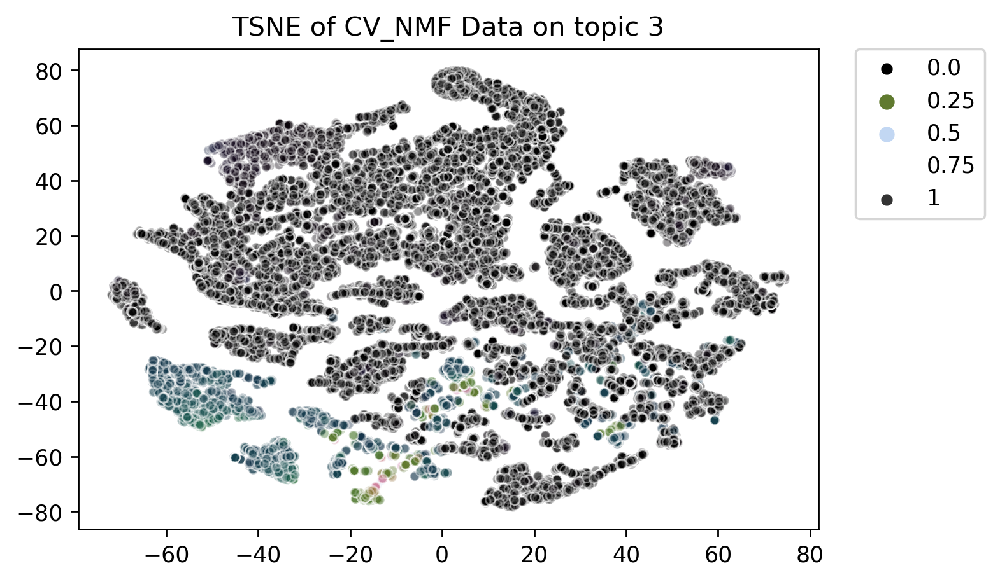

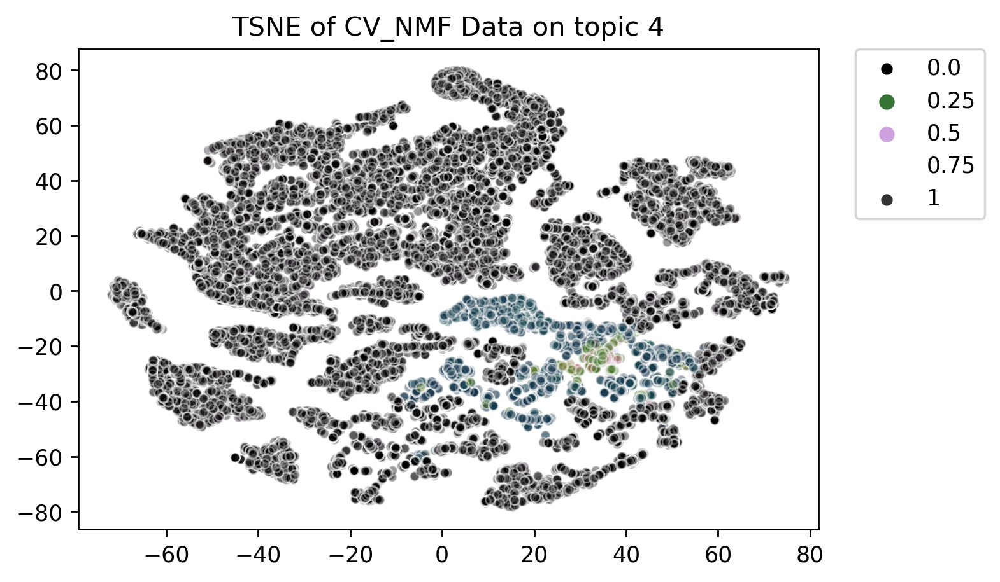

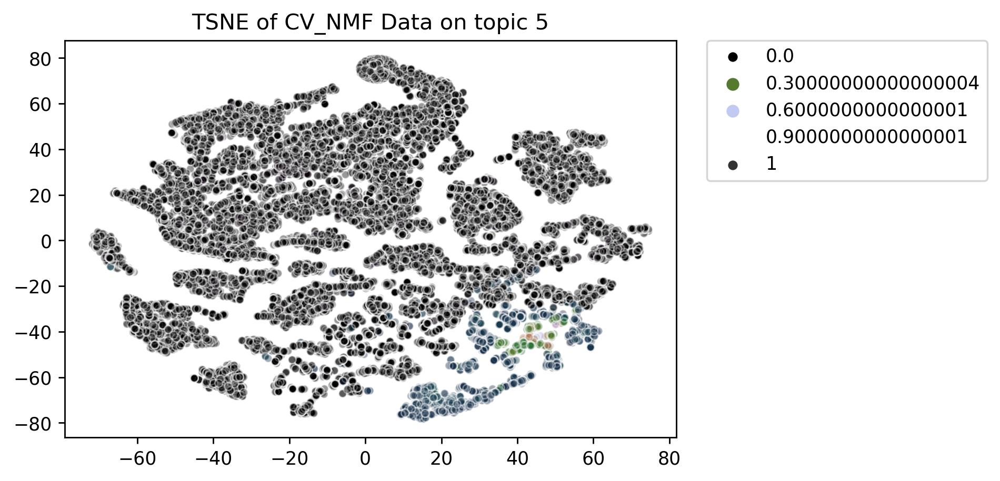

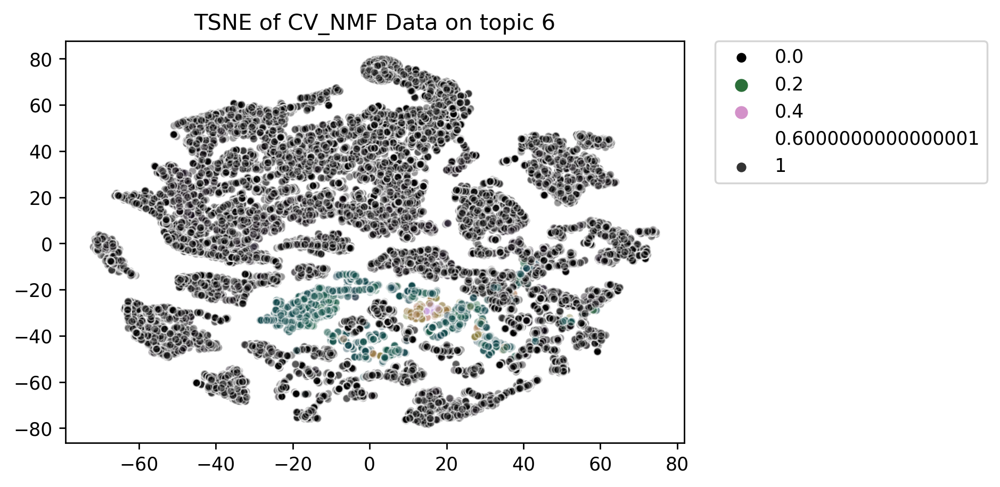

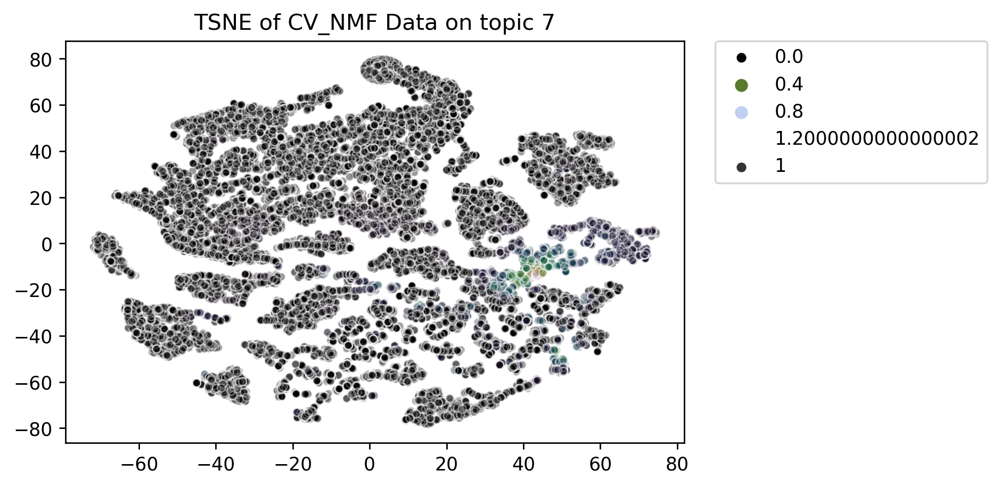

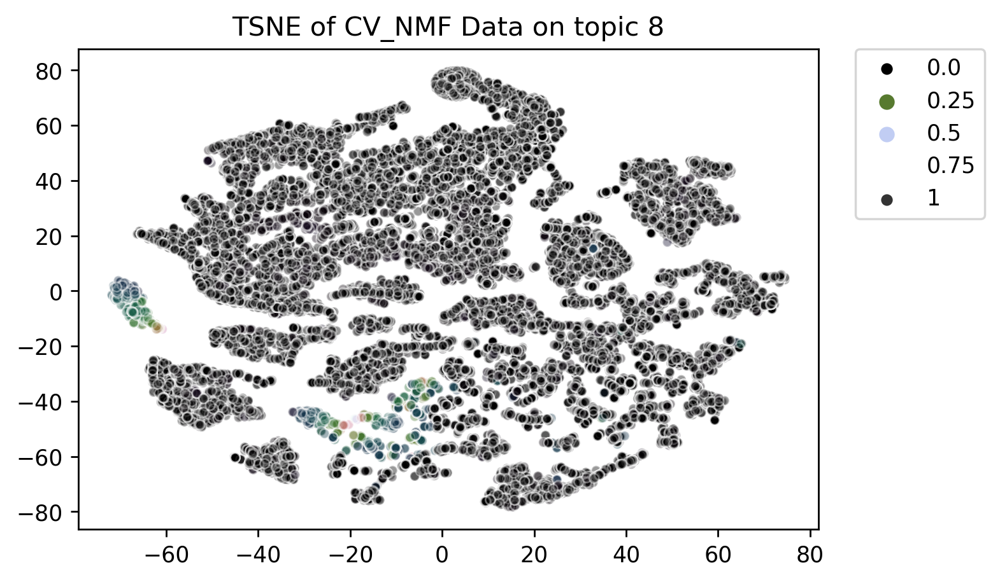

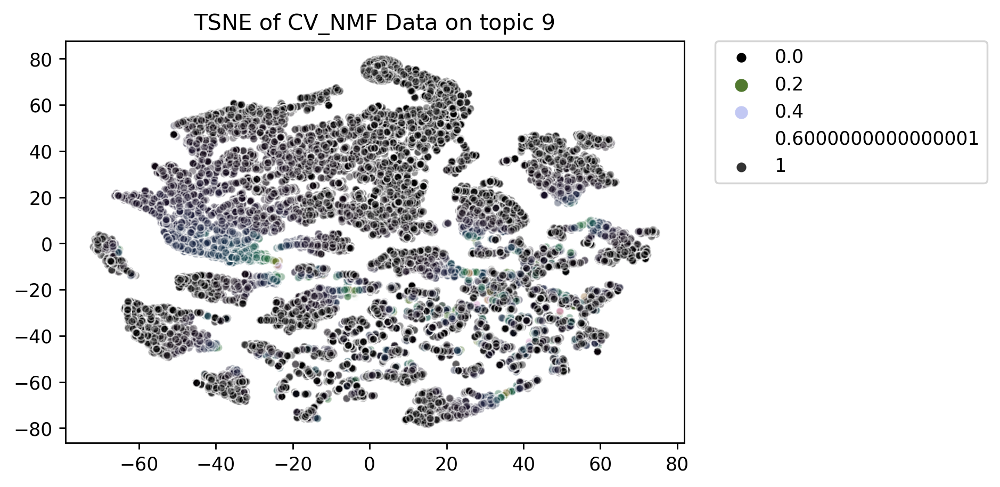

In [377]:
for i in range(10):
    checkfeature_on_tsne(cv_nmf_embedded, 'TSNE of CV_NMF Data', cv_nmf_data, i)

In [ ]:
with open('./data/processed/cv_nmf_embedded.pkl', 'wb') as picklefile:
    pickle.dump(cv_nmf_embedded, picklefile)

In [ ]:
SSEs = []
X = StandardScaler().fit_transform(lsa_tfidf_data)
for k in range(2,100,4):
    print ('clustering trial:', k)
    km = KMeans(n_clusters=k, random_state=1)
    km.fit(X)
    labels = km.labels_
    #Sil_coefs.append(metrics.silhouette_score(lsa_tfidf_data, labels, metric='euclidean'))
    SSEs.append(get_SSE(X, labels)) # The SSE is just inertia, we could have just said km.inertia_

In [ ]:
df_ticket_google.shape

In [ ]:
google_SSEs = []
google_X = StandardScaler().fit_transform(df_ticket_google)
for k in range(2,100,4):
    print ('clustering trial:', k)
    km = KMeans(n_clusters=k, random_state=1)
    km.fit(google_X)
    labels = km.labels_
    #Sil_coefs.append(metrics.silhouette_score(lsa_tfidf_data, labels, metric='euclidean'))
    google_SSEs.append(get_SSE(google_X, labels)) # The SSE is just inertia, we could have just said km.inertia_

In [ ]:
k_clusters = range(2,100,4)
plt.figure(dpi=200)

# plot Intertia/SSE on ax2
plt.plot(k_clusters, SSEs)
plt.xlabel('number of clusters')
plt.ylabel('SSE')
plt.xticks(np.arange(2, 100, step=4));
plt.title ('SSE vs Clusters')

In [ ]:
k_clusters = range(2,100,4)
plt.figure(dpi=200)

# plot Intertia/SSE on ax2
plt.plot(k_clusters, google_SSEs)
plt.xlabel('number of clusters')
plt.ylabel('google SSE')
plt.xticks(np.arange(2, 100, step=4));
plt.title ('SSE vs Google Clusters')

In [ ]:
X = StandardScaler().fit_transform(lsa_tfidf_data)
km = KMeans(n_clusters=20)
ypred_lsa = km.fit_predict(X)
plt.figure(dpi=200)
plt.scatter(X[:,0],X[:,1],c=plt.cm.rainbow(ypred_lsa*20),s=14);

In [ ]:
google_X = StandardScaler().fit_transform(df_ticket_google)
km = KMeans(n_clusters=10)
ypred_google = km.fit_predict(google_X)
plt.figure(dpi=200)
plt.scatter(X[:,0],X[:,1],c=plt.cm.rainbow(ypred_google*20),s=14);

In [ ]:
from sklearn.manifold import TSNE

X_embedded = TSNE(n_components=2, verbose=1, perplexity=50).fit_transform(lsa_tfidf_data)
X_embedded.shape

In [ ]:
with open('./data/processed/X_embedded.pkl', 'wb') as picklefile:
    pickle.dump(X_embedded, picklefile)

In [ ]:
with open('./data/processed/X_embedded.pkl', 'rb') as picklefile:
    X_embedded = pickle.load(picklefile)

In [ ]:
plt.figure(dpi=250)
plt.title("TSNE FOR LSA TFIDF DATA")
sns.scatterplot(X_embedded[:, 0], X_embedded[:, 1], ypred_lsa,
               size = 2, palette = 'rainbow', alpha = 'auto',
              markers = '.', legend="full");

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.);

In [ ]:
google_embedded = TSNE(n_components=2, verbose=1, perplexity=50).fit_transform(google_X)
google_embedded.shape

In [ ]:
with open('./data/processed/google_embedded.pkl', 'wb') as picklefile:
    pickle.dump(google_embedded, picklefile)

In [ ]:
plt.figure(dpi=250)
plt.title("TSNE FOR Google Word2Vec DATA")
sns.scatterplot(google_embedded[:, 0], google_embedded[:, 1], ypred_google,
               size = 2, palette = 'rainbow', alpha = 'auto',
              markers = '.', legend="full");

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.);

### Experiment with different parameters

In [ ]:
engine_dict ={
    0:'tfidf_10_lsa',
    1:'tfidf_10_nmf',
    2:'tfidf_20_lsa',
    3:'tfidf_20_nmf',
    4:'tfidf_30_lsa',
    5:'tfidf_30_nmf',
    6:'tfidf_40_lsa',
    7:'tfidf_40_nmf',
    8:'tfidf_50_lsa',
    9:'tfidf_50_nmf',
    10:'cv_10_lsa',
    11:'cv_10_nmf',
    12:'cv_20_lsa',
    13:'cv_20_nmf',
    14:'cv_30_lsa',
    15:'cv_30_nmf',
    16:'cv_40_lsa',
    17:'cv_40_nmf',
    18:'cv_50_lsa',
    19:'cv_50_nmf'
}

In [ ]:
vectorizers = [tfidf_vectorizer, count_vectorizer]
n_components = np.arange(50, 310, 50)
reducers = [TruncatedSVD, NMF]
df_subset = df_ticket[0:2000]

In [ ]:
veduced_data = []
tsned_data = []
for vectorizer in vectorizers:
    for component in n_components:
        for reducer in reducers:
            engine = RecommendationEngine(vectorizer, component, reducer, ticket = ticket_origin, solution=solution_origin)
            topic_data = engine.fit(df_subset)
            veduced_data.append(topic_data)
            data_embedded = TSNE(n_components=2, verbose=1, perplexity=50).fit_transform(topic_data)
            tsned_data.append(data_embedded)

In [ ]:
y_preds = []
for i in range(len(veduced_data)):
    y_pred = fitKmeans(veduced_data[i], 15)
    y_preds.append(y_pred)
    plot_on_tsne(y_pred, engine_dict[i], tsned_data[i])

In [ ]:
with open('./data/processed/tsned_data.pkl', 'wb') as picklefile:
    pickle.dump(tsned_data, picklefile)
with open('./data/processed/veduced_data.pkl', 'wb') as picklefile:
    pickle.dump(veduced_data, picklefile)

### Try Higher dimension topics

In [ ]:
engine_dict2 = {
0:'tfidf_50_lsa',
1:'tfidf_50_nmf',
2:'tfidf_100_lsa',
3:'tfidf_100_nmf',
4:'tfidf_150_lsa',
5:'tfidf_150_nmf',
6:'tfidf_200_lsa',
7:'tfidf_200_nmf',
8:'tfidf_250_lsa',
9:'tfidf_250_nmf',
10:'tfidf_300_lsa',
11:'tfidf_300_nmf',
12:'cv_50_lsa',
13:'cv_50_nmf',
14:'cv_100_lsa',
15:'cv_100_nmf',
16:'cv_150_lsa',
17:'cv_150_nmf',
18:'cv_200_lsa',
19:'cv_200_nmf',
20:'cv_250_lsa',
21:'cv_250_nmf',
22:'cv_300_lsa',
23:'cv_300_nmf'
}

In [ ]:
vectorizers = [tfidf_vectorizer, count_vectorizer]
n_components = np.arange(50, 310, 50)
reducers = [TruncatedSVD, NMF]

In [ ]:
veduced_data2 = []
tsned_data2 = []
for vectorizer in vectorizers:
    for component in n_components:
        for reducer in reducers:
            engine = RecommendationEngine(vectorizer, component, reducer, ticket = ticket_origin, solution=solution_origin)
            topic_data = engine.fit(df_subset)
            veduced_data2.append(topic_data)
            data_embedded = TSNE(n_components=2, verbose=1, perplexity=50).fit_transform(topic_data)
            tsned_data2.append(data_embedded)

In [ ]:
y_preds2 = []
for i in range(len(veduced_data2)):
    y_pred = fitKmeans(veduced_data2[i], 5)
    y_preds2.append(y_pred)
    plot_on_tsne(y_pred, engine_dict2[i], tsned_data2[i])

In [ ]:
with open('./data/processed/tsned_data2.pkl', 'wb') as picklefile:
    pickle.dump(tsned_data, picklefile)
with open('./data/processed/veduced_data2.pkl', 'wb') as picklefile:
    pickle.dump(veduced_data, picklefile)

### Fit all the data with better pipelines

In [ ]:
good_pipe = ([
    [tfidf_vectorizer, 10, TruncatedSVD],
    [tfidf_vectorizer, 20, TruncatedSVD]
])

In [ ]:
veduced_data3 = []
tsned_data3 = []
for model in good_pipe:
    engine = RecommendationEngine(model[0], model[1], model[2], ticket = ticket_origin, solution=solution_origin)
    topic_data = engine.fit(df_ticket)
    veduced_data3.append(topic_data)
    data_embedded = TSNE(n_components=2, verbose=1, perplexity=50).fit_transform(topic_data)
    tsned_data3.append(data_embedded)

In [ ]:
with open('./data/processed/tsned_data3.pkl', 'wb') as picklefile:
    pickle.dump(tsned_data3, picklefile)
with open('./data/processed/veduced_data3.pkl', 'wb') as picklefile:
    pickle.dump(veduced_data3, picklefile)

In [ ]:
y_preds3 = []
for i in range(len(veduced_data3)):
    y_pred = fitKmeans(veduced_data3[i],15)
    y_preds3.append(y_pred)
    plot_on_tsne(y_pred, i, tsned_data3[i])

In [382]:
def cluster_center10(ticket, cluster, km_model, label, veduced_data, ticket_agg, original_flag=True):
    ticket = deepcopy(df_ticket)
    ticket['label'] = label
    
    original = deepcopy(ticket_agg)
    original = pd.DataFrame(ticket_agg).reset_index()
    
    centers = km_model.cluster_centers_
    cluster_index = ticket[ticket['label'] == cluster].index
    vduced_cluster = veduced_data[cluster_index]
    distances = []
    for point in vduced_cluster:
        dist=np.linalg.norm(point - centers[cluster])
        distances.append(dist)
    cluster_dist = pd.DataFrame(distances, index=cluster_index, columns=['dist'])
    cluster_top10 = ticket.text[cluster_dist.sort_values('dist').head(10).index]
    original_top10 = original.text[cluster_dist.sort_values('dist').head(10).index]
    
    if (not original_flag):
        return cluster_top10
    else:
        return original_top10

In [384]:
for i in range(15):
    print (f"---topic {i}---")
    print (cluster_center10(ticket_agg, i, km_cv, y_pred_cv_nmf, cv_nmf_data, ticket_agg, False))
    print ("---------------")

---topic 0---
22564    did make playlist yesterday songs just changed suggested songs songs fit actual playlist songs playlist listened suggested tracks actual tracks playlist changed songs listened suggested songs reflect playlist meant songs randomly added playlist                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      
12353    does kind feature pick fav songs playlist cuz works time lol just played playlist 140 half half fav songs ok songs 1 h played half favs smh just played playlist 13 songs today 7 songs like 6 songs played 6 songs like 6 songs.. weird thank               

Name: text, dtype: object
---------------
---topic 3---
12682    akun jiqin sudah bayar premium 1 bulan mandiri clickpay tapi gagal mohon bantuannya sekarang sudah premium karena beli lagi okay paid 1 month premium account mandiri clickpay does make premium member                                                                                                                                                                                                                                                            
15299    seeing deals new premium listeners ... y ’ trying premium listeners years literally hook bro ’ ve loyal y ’ lol ’ ve premium user 2012 literally seen promotion open active subscribers okay maybe ’ ll ahead cancel premium subscription waiting deals                                                                                                                                                                                                            
4252     trying switch

11893    ios app glitchy ios update thing noticed stops playig occasionally exit app plays fast forwarded                                                                                                                                                   
17911    app keeps crashing tbf does app sure phone samsung s5 mini late update                                                                                                                                                                             
24044    log mobile app screen dark screen whatsoever tell does n't app says line true wifi mobile data working log                                                                                                                                         
7369     app crashing pixel xl attempting 2 share running android 8.0.0. cleared cache app storage reinstalled awesome going couple days 's application version running                                                                          

In [350]:
label = deepcopy(df_ticket)
label['label'] = y_pred_cv_nmf

In [352]:
label['label'].value_counts()/label.shape[0]

2     0.368951
3     0.081113
7     0.072290
9     0.067913
1     0.060896
12    0.060027
13    0.056171
11    0.051169
0     0.051169
4     0.043006
8     0.040956
14    0.015493
6     0.011359
10    0.010248
5     0.009240
Name: label, dtype: float64